In [1]:
import os
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import xml.etree.ElementTree as ET
import ipyplot
from ultralytics import YOLO
import random
import shutil

In [2]:
def load_voc_data(dir, classes, split="train"):
    """
    loading the PASCAL VOC2012 data

    args:
        path: root directory of Vof OC2012
        classes: classes to load
        split: train or val

    returns:
        dataset: list of image 
        labels: class labels for each image
        boxes: bounding boxes for each image
    """
    base_dir = os.path.join(dir, "VOC2012")
    # VOC2012/ImageSets/Main, txt that includes all the info
    image_set_path = os.path.join(base_dir, "ImageSets", "Main")
    # print(image_set_path)

    # VOC2012/JPEGImages, images that contain the classes
    image_dir = os.path.join(base_dir, "JPEGImages")
    # print(image_path)

    # annotations, xml files that contain the bounding boxes
    annotation_dir = os.path.join(base_dir, "Annotations")

    # dataset = {image_id: image_path}
    dataset = {}

    # labels = {image_id: [0,0,0,0,0]}
    # array keeps track of classes present in the image
    # ["bicycle", "motorbike", "person", "cat", "train"]
    labels = {}

    # bboxes = {image_id: [[class_idx, xmin, ymin, xmax, ymax], ...]}
    bboxes = {}

    for cls_idx, cls in enumerate(classes):
        file_name = f"{cls}_{split}.txt"
        file_path = os.path.join(image_set_path, file_name)
        # print("current class...", cls)

        # open the current file
        with open(file_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            image_id, label = line.strip().split()
            # print(image_id, label)
            # 0 mean difficult to tell if class is present
            # -1 not object of class in the image
            # 1 object of class in the image
            if label == "0":
                continue

            image_path = os.path.join(image_dir, f"{image_id}.jpg")
            annotation_path = os.path.join(annotation_dir, f"{image_id}.xml")
            if os.path.exists(image_path) and os.path.exists(annotation_path):
                if image_id not in dataset:
                    labels[image_id] = np.zeros(len(classes))
                    dataset[image_id] = image_path
                    bboxes[image_id] = []

                    # parse the annotation file
                    tree = ET.parse(annotation_path)
                    root = tree.getroot()
                    for obj in root.findall("object"):
                        cls_name = obj.find("name").text
                        if cls_name in classes:
                            bbox = obj.find("bndbox")
                            xmin = int(bbox.find("xmin").text)
                            ymin = int(bbox.find("ymin").text)
                            xmax = int(bbox.find("xmax").text)
                            ymax = int(bbox.find("ymax").text)

                            class_idx = classes.index(cls_name)
                            bboxes[image_id].append([class_idx, xmin, ymin, xmax, ymax])

                # 0 not present, 1 present
                labels[image_id][cls_idx] = 1 if label == "1" else 0
    dataset = list(dataset.values())
    labels = np.array(list(labels.values()))
    bboxes = list(bboxes.values())
    return dataset, labels, bboxes


file_dir = os.getcwd()

classes = ["bicycle", "motorbike", "person", "cat", "train"]

train_images, train_labels, train_bboxes = load_voc_data(file_dir, classes, "train")
val_images, val_labels, val_bboxes = load_voc_data(file_dir, classes, "val")


bboxes 0 has 1 objects
bboxes 1 has 0 objects
bboxes 2 has 0 objects
bboxes 3 has 3 objects
bboxes 4 has 0 objects
bboxes 5 has 0 objects
bboxes 6 has 3 objects
bboxes 7 has 0 objects
bboxes 8 has 7 objects
bboxes 9 has 1 objects
bboxes 10 has 0 objects
bboxes 11 has 1 objects
bboxes 12 has 0 objects
bboxes 13 has 0 objects
bboxes 14 has 0 objects
bboxes 15 has 0 objects
bboxes 16 has 0 objects
bboxes 17 has 0 objects
bboxes 18 has 0 objects
bboxes 19 has 2 objects
bboxes 20 has 0 objects
bboxes 21 has 0 objects
bboxes 22 has 0 objects
bboxes 23 has 0 objects
bboxes 24 has 2 objects
bboxes 25 has 1 objects
bboxes 26 has 2 objects
bboxes 27 has 0 objects
bboxes 28 has 2 objects
bboxes 29 has 1 objects
bboxes 30 has 2 objects
bboxes 31 has 2 objects
bboxes 32 has 2 objects
bboxes 33 has 0 objects
bboxes 34 has 0 objects
bboxes 35 has 0 objects
bboxes 36 has 0 objects
bboxes 37 has 1 objects
bboxes 38 has 1 objects
bboxes 39 has 1 objects
bboxes 40 has 0 objects
bboxes 41 has 0 objects
bb

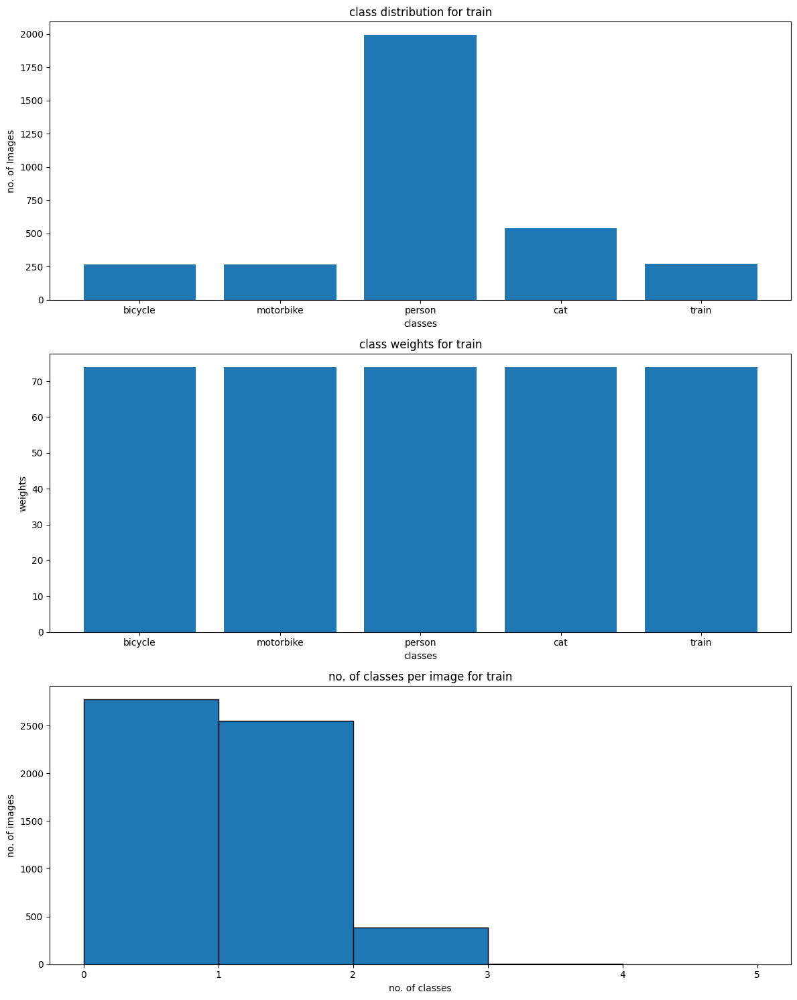

bboxes 0 has 0 objects
bboxes 1 has 2 objects
bboxes 2 has 0 objects
bboxes 3 has 0 objects
bboxes 4 has 0 objects
bboxes 5 has 0 objects
bboxes 6 has 1 objects
bboxes 7 has 0 objects
bboxes 8 has 1 objects
bboxes 9 has 3 objects
bboxes 10 has 0 objects
bboxes 11 has 0 objects
bboxes 12 has 0 objects
bboxes 13 has 2 objects
bboxes 14 has 2 objects
bboxes 15 has 0 objects
bboxes 16 has 1 objects
bboxes 17 has 1 objects
bboxes 18 has 1 objects
bboxes 19 has 0 objects
bboxes 20 has 1 objects
bboxes 21 has 0 objects
bboxes 22 has 0 objects
bboxes 23 has 0 objects
bboxes 24 has 0 objects
bboxes 25 has 0 objects
bboxes 26 has 3 objects
bboxes 27 has 0 objects
bboxes 28 has 7 objects
bboxes 29 has 0 objects
bboxes 30 has 1 objects
bboxes 31 has 1 objects
bboxes 32 has 1 objects
bboxes 33 has 0 objects
bboxes 34 has 0 objects
bboxes 35 has 1 objects
bboxes 36 has 0 objects
bboxes 37 has 5 objects
bboxes 38 has 0 objects
bboxes 39 has 0 objects
bboxes 40 has 0 objects
bboxes 41 has 0 objects
bb

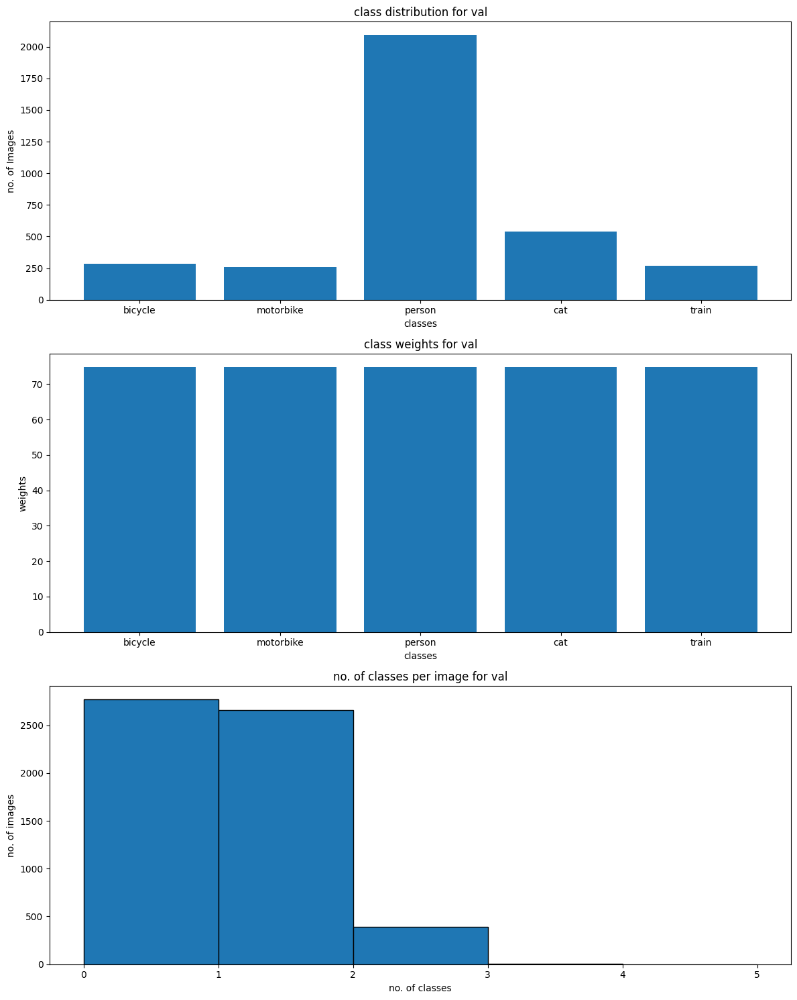

In [3]:
def calculate_class_weights(labels, classes):
    """
    creating class weights to balance the dataset
    """
    class_count = labels.sum(axis=0)
    weights = len(labels) / (len(classes) * class_count)
    weights = weights / weights.sum()
    return weights

def plot_class_distribution(labels, class_count, classes, split, weights=None):
    """
    plots the class distribution and class weights
    """

    n_plots = 3 if weights is not None else 2
    fig, axes = plt.subplots(n_plots, 1, figsize=(12, 5 * n_plots))
    axes[0].bar(classes, class_count)
    axes[0].set_title(f"class distribution for {split}")
    axes[0].set_xlabel("classes")
    axes[0].set_ylabel("no. of Images")

    if weights is not None:
        weights = class_count * weights
        axes[1].bar(classes, weights)
        axes[1].set_title(f"class weights for {split}")
        axes[1].set_xlabel("classes")
        axes[1].set_ylabel("weights")

        # multi-label classification
        labels_per_image = labels.sum(axis=1)
        axes[2].hist(labels_per_image, bins=range(len(classes) + 1), edgecolor="black")
        axes[2].set_title(f"no. of classes per image for {split}")
        axes[2].set_xlabel("no. of classes")
        axes[2].set_ylabel("no. of images")
    else:
        # multi-label classification
        labels_per_image = labels.sum(axis=1)
        axes[1].hist(labels_per_image, bins=range(len(classes) + 1), edgecolor="black")
        axes[1].set_title(f"no. of classes per image for {split}")
        axes[1].set_xlabel("no. of classes")
        axes[1].set_ylabel("no. of images")

    plt.tight_layout()
    plt.show()

def EDA(labels, bboxes, classes, split):
    """
    perform data analysis
    """
    class_count = labels.sum(axis=0)
    for i in range(len(bboxes)):
        print(f"bboxes {i} has {len(bboxes[i])} objects")
    print("class count:", class_count)
    print(f"class distribution in {split}:")
    for class_name, count in zip(classes, class_count):
        print(f"{class_name:10}: {int(count):4d} Images")

    weights = calculate_class_weights(labels, classes)
    print(f"class weights in {split}:")
    for cls, weight in zip(classes, weights):
        print(f"{cls:10}: {weight:.4f}")

    # plot the class distribution and class weights
    plot_class_distribution(labels, class_count, classes, split, weights)


EDA(train_labels, train_bboxes, classes, "train")
EDA(val_labels, val_bboxes, classes, "val")


In [4]:
def normalize_bboxes(bboxes, img_width, img_height):
    """
    normalize the bounding boxes to YOLO format
    returns:
        normalized bboxes: [class_idx, x_center, y_center, width, height]
        normalized to [0, 1]
    """
    class_idx, xmin, ymin, xmax, ymax = bboxes
            
    # Convert to YOLO format
    x_center = ((xmin + xmax) / 2) / img_width
    y_center = ((ymin + ymax) / 2) / img_height
    width = (xmax - xmin) / img_width
    height = (ymax - ymin) / img_height
    return [class_idx, x_center, y_center, width, height]

In [5]:
def normalize_data(images, bboxes, output_dir, split="train", max_per_class=200):
    """
    Normalize images and bounding boxes for YOLO
    
    Args:
        images: list of image paths
        bboxes: list of bounding boxes
    """
    output_dir = Path(output_dir)
    images_dir = output_dir / split / "images"
    labels_dir = output_dir / split / "labels"

    # clearing the directory
    if images_dir.exists():
        shutil.rmtree(images_dir)
    if labels_dir.exists():
        shutil.rmtree(labels_dir)

    images_dir.mkdir(parents=True, exist_ok=True)
    labels_dir.mkdir(parents=True, exist_ok=True)

    indices = list(range(len(images)))
    np.random.shuffle(indices)

    # grouping by class
    class_counts  = {i: 0 for i in range(5)}
    processed_images = set()
    
    # print("sample images path:", images[0])
    # print("sample bboxes:", bboxes[0])

    for idx in indices:
        img_path = images[idx]
        img_bboxes = bboxes[idx]

        classes_in_image = set(bbox[0] for bbox in img_bboxes)
        # print("classes in image:", classes_in_image)

        can_add = False
        for class_idx in classes_in_image:
            if class_counts[class_idx] < max_per_class:
                can_add = True
                break

        if can_add:
            for class_idx in classes_in_image:
                class_counts[class_idx] += 1
            processed_images.add(idx)

        if all(count >= max_per_class for count in class_counts.values()):
            break

    print("processed images:", len(processed_images))

    for idx in processed_images:
        img_path = images[idx]
        img_bboxes = bboxes[idx]

        img_name = Path(img_path).stem

        img = Image.open(img_path)
        orig_width, orig_height = img.size

        # normalize the image size to 640x640
        img = img.resize((640, 640))
        new_img_path = images_dir / f"{img_name}.jpg"
        img.save(new_img_path)
        
        # Normalize bounding boxes for this image
        label_path = labels_dir / f"{img_name}.txt"
        with open(label_path, "w") as f:
            for bbox in img_bboxes:
                norm_bbox = normalize_bboxes(bbox, orig_width, orig_height)
                class_idx, x_center, y_center, width, height = norm_bbox
                f.write(f"{class_idx} {x_center} {y_center} {width} {height}\n")
        
        print(f"processed {img_name}") 

dataset_dir = "yolo_dataset"
    
print("Normalizing training data...")   
normalize_data(train_images, train_bboxes, dataset_dir, split="train", max_per_class=200)
print("Normalizing validation data...")
normalize_data(val_images, val_bboxes, dataset_dir, split="val", max_per_class=200)

current_dir = os.getcwd()

yaml_content = f"""
path: {current_dir}
train: yolo_dataset/train/images
val: yolo_dataset/val/images

# classes
names:
    0: bicycle
    1: motorbike
    2: person
    3: cat
    4: train
"""

yaml_path = os.path.join(current_dir, "yolo_dataset.yaml")

# make if doesn't exist
os.makedirs(os.path.join(current_dir), exist_ok=True)

with open(yaml_path, "w") as f:
    f.write(yaml_content)

# Verify paths
train_path = os.path.join(current_dir, 'yolo_dataset/train/images')
val_path = os.path.join(current_dir, 'yolo_dataset/val/images')

print(f"Train path : {train_path}")
print(f"Val path : {val_path}")
print(f"YAML path: {yaml_path}")

print("dataset yaml file created")

Normalizing training data...
processed images: 945
processed 2010_002553
processed 2008_008545
processed 2008_000036
processed 2008_008572
processed 2008_008583
processed 2010_002594
processed 2008_008591
processed 2010_002618
processed 2008_008618
processed 2008_000112
processed 2008_008641
processed 2008_008637
processed 2010_002656
processed 2008_000143
processed 2008_000144
processed 2008_008671
processed 2008_008681
processed 2010_002697
processed 2008_008691
processed 2010_002708
processed 2008_008696
processed 2010_002722
processed 2008_008697
processed 2008_008707
processed 2008_008717
processed 2008_000196
processed 2010_002747
processed 2008_008725
processed 2008_000227
processed 2008_008757
processed 2008_008749
processed 2008_000237
processed 2008_008770
processed 2010_002801
processed 2009_000021
processed 2010_002820
processed 2008_000297
processed 2009_000073
processed 2010_002851
processed 2010_002855
processed 2010_002865
processed 2009_000105
processed 2008_000343
pro

Checking Training Set:
Displaying 5 images from train set:



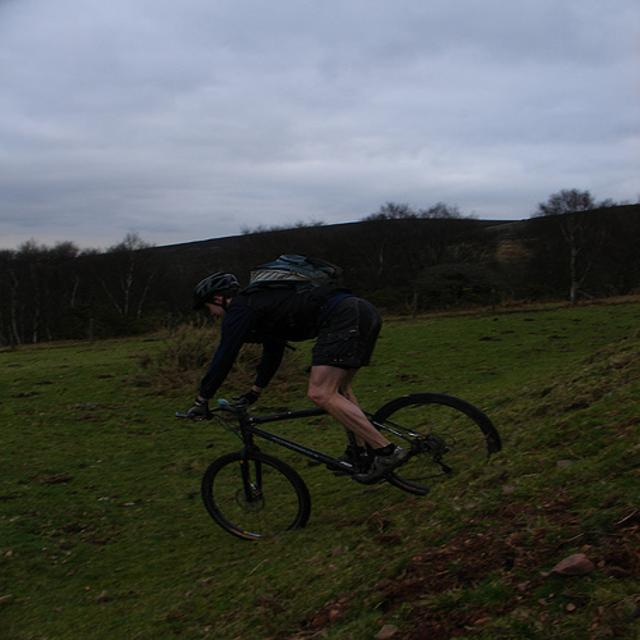
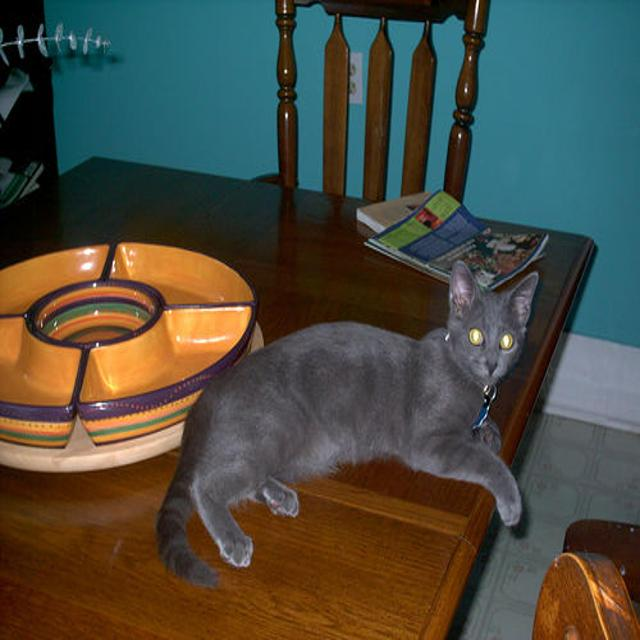
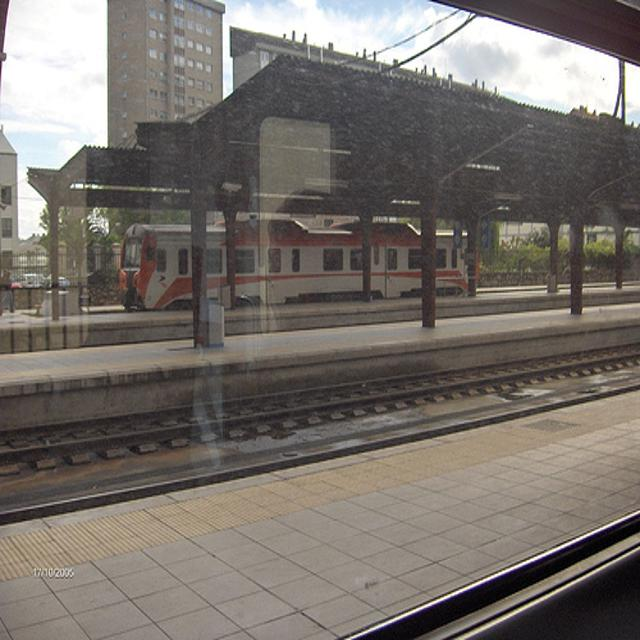
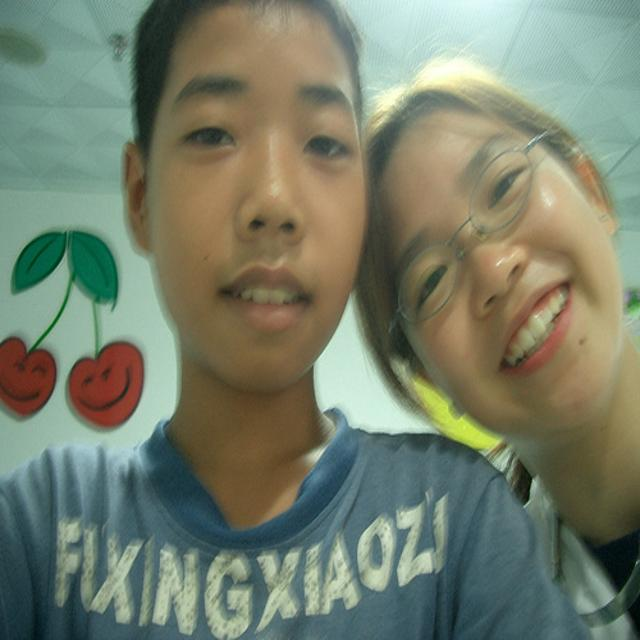
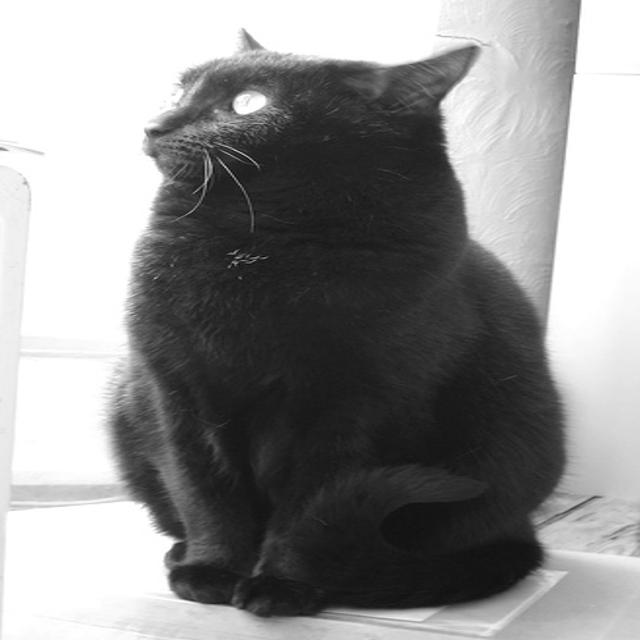


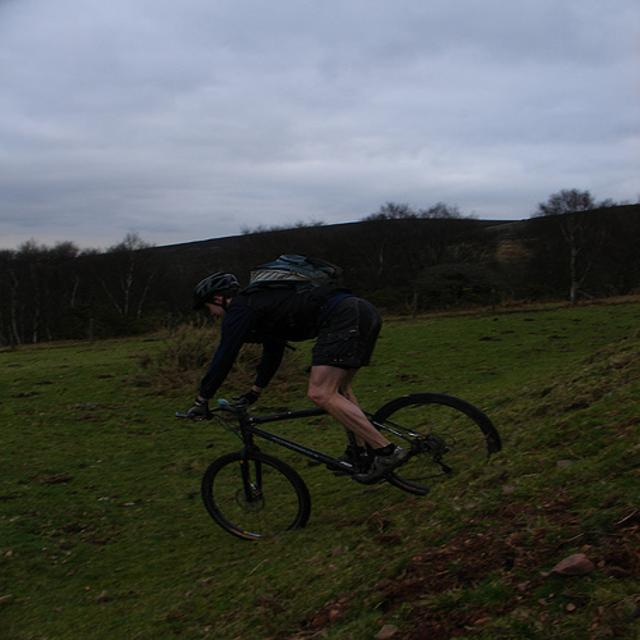
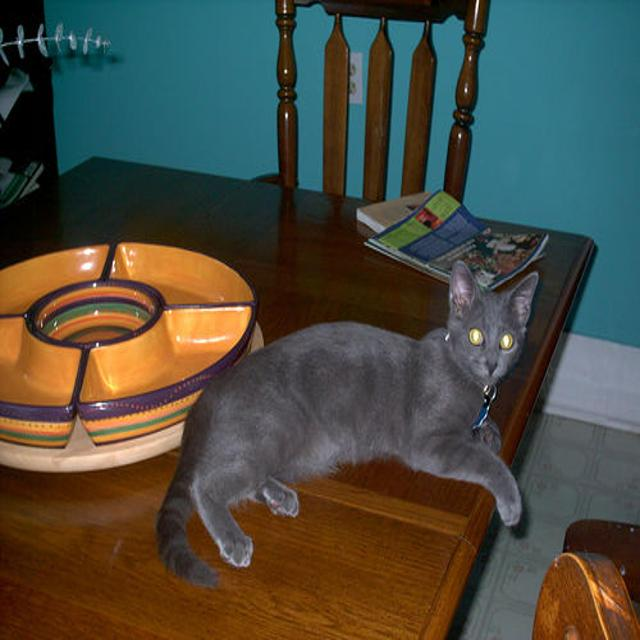
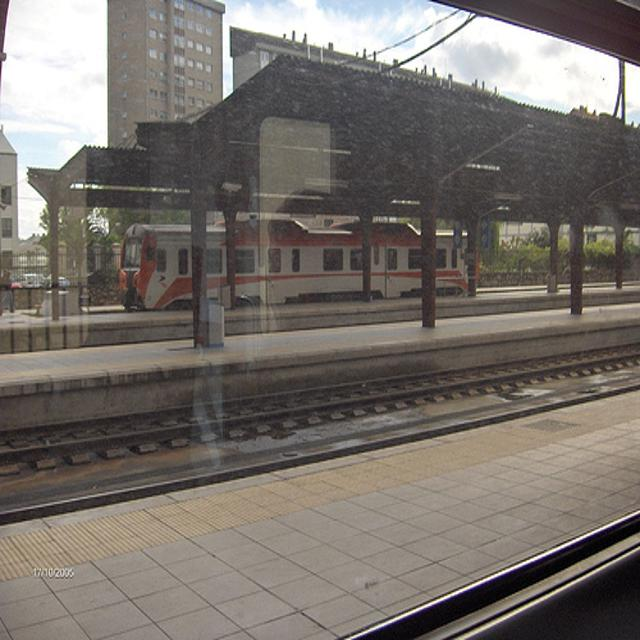
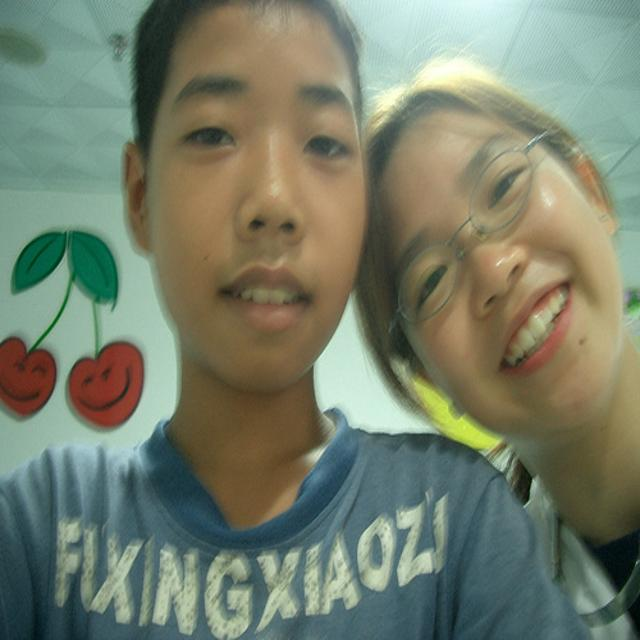
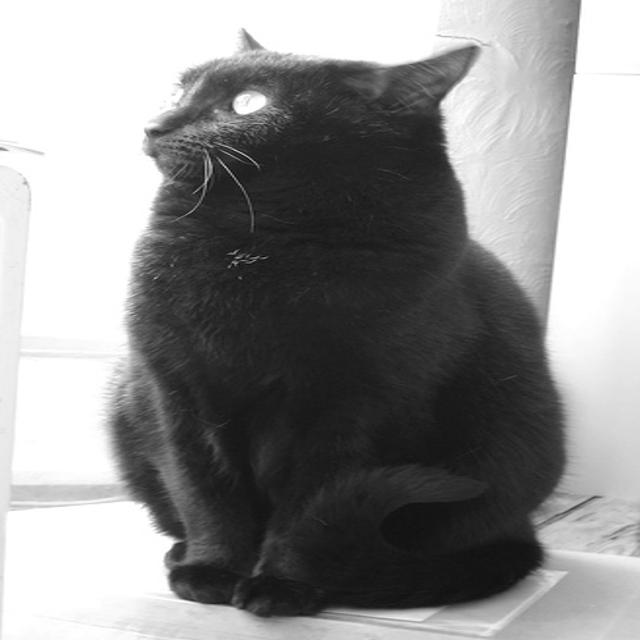


Checking Image Properties:

Image 0: 2008_004325.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 220]
- Data Type: uint8

Bounding Boxes:
- Class 0: center=(0.528, 0.732), size=(0.517, 0.232)
- Coordinates in [0,1]: True
- Class 2: center=(0.461, 0.589), size=(0.347, 0.318)
- Coordinates in [0,1]: True

Image 1: 2008_000227.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 3: center=(0.544, 0.664), size=(0.608, 0.517)
- Coordinates in [0,1]: True

Image 2: 2010_005643.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 4: center=(0.468, 0.412), size=(0.568, 0.154)
- Coordinates in [0,1]: True

Image 3: 2008_003707.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 2: center=(0.465, 0.501), size=(0.926, 0.997)
- Coordinates in [0,1]: True
- Class 2: center=(0.774, 0.544), size=(0.452, 0.912)
- Coordinates in [0,1]: True

Image 4: 2010_005275.jpg
- Shape: (64


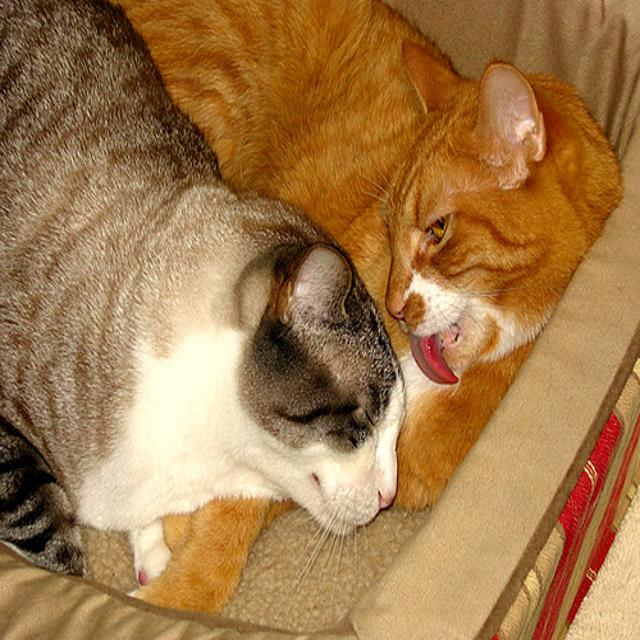
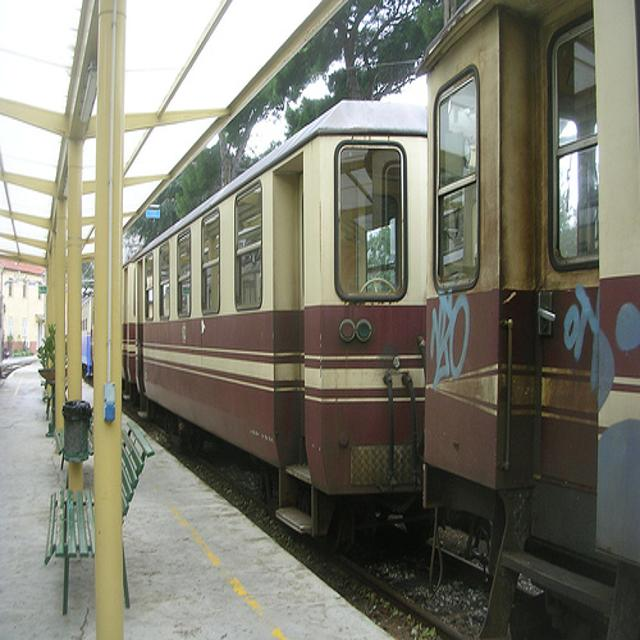
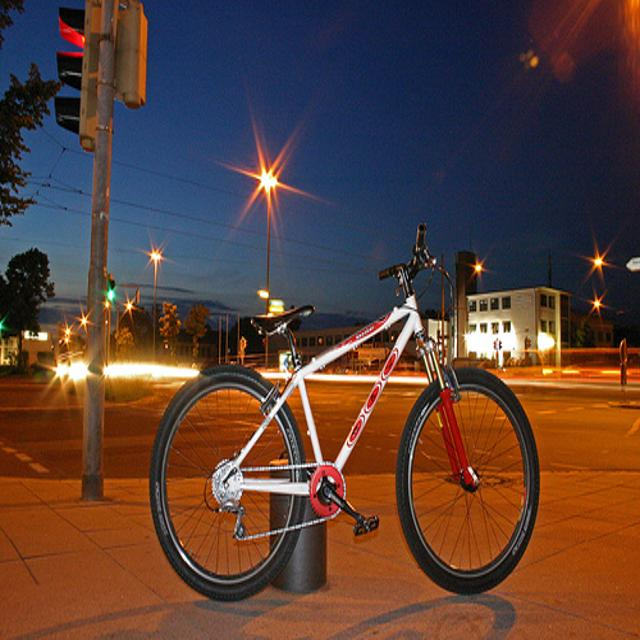
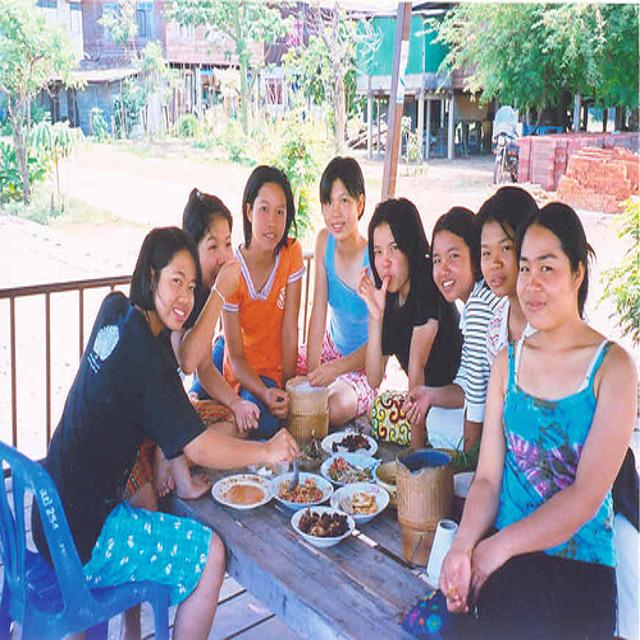
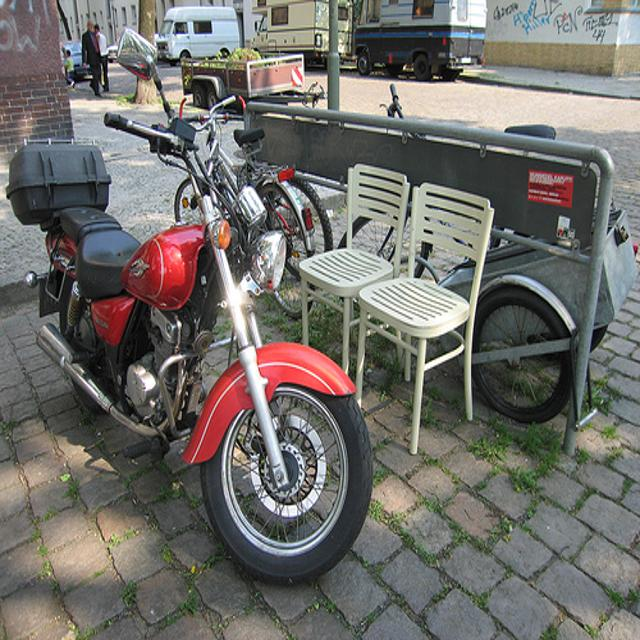


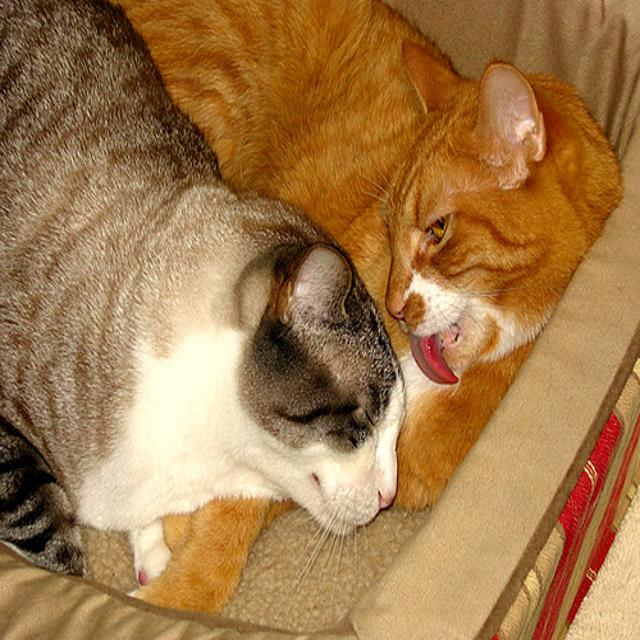
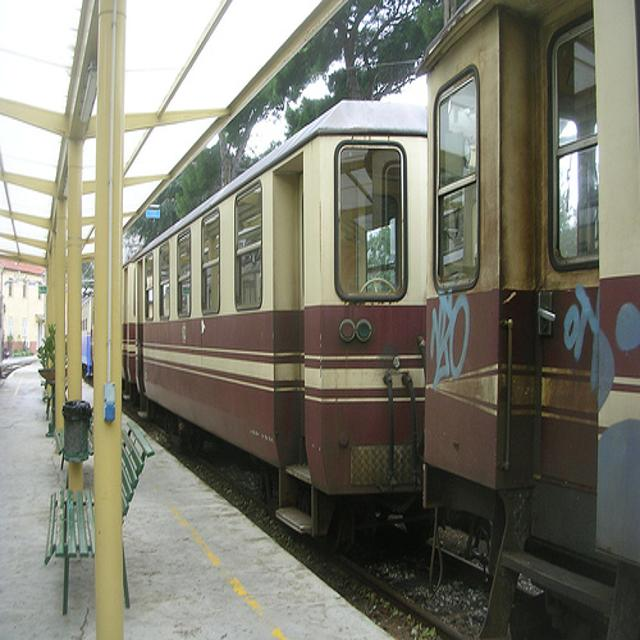
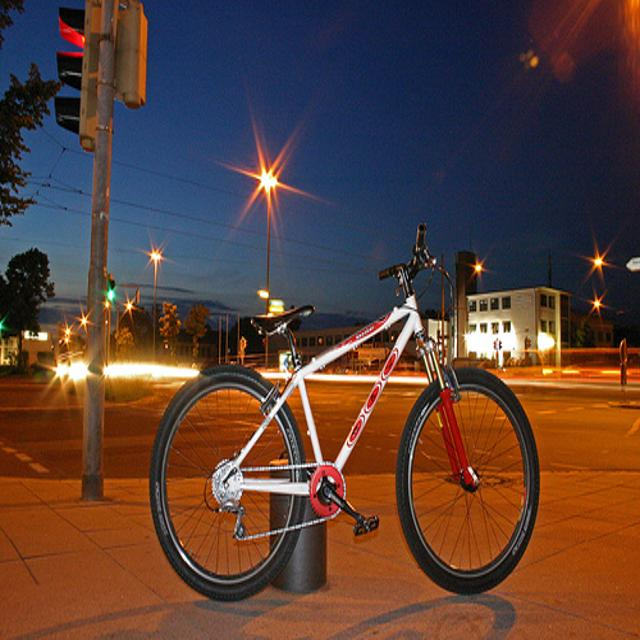
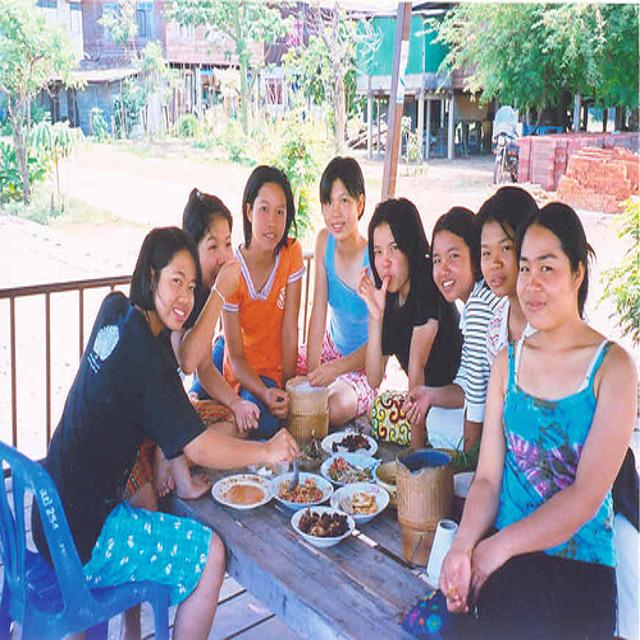
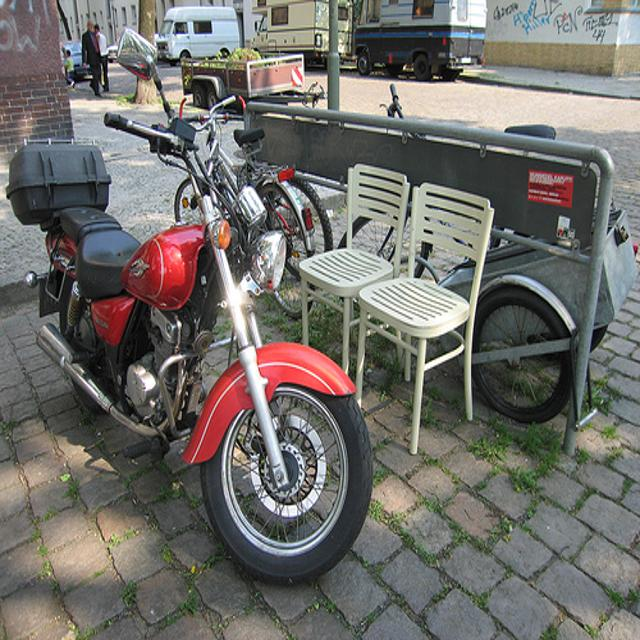


Checking Image Properties:

Image 0: 2009_003718.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 3: center=(0.321, 0.450), size=(0.634, 0.894)
- Coordinates in [0,1]: True
- Class 3: center=(0.578, 0.491), size=(0.784, 0.956)
- Coordinates in [0,1]: True

Image 1: 2008_008203.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 4: center=(0.595, 0.501), size=(0.810, 0.997)
- Coordinates in [0,1]: True

Image 2: 2010_000401.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 0: center=(0.540, 0.646), size=(0.616, 0.601)
- Coordinates in [0,1]: True

Image 3: 2010_005620.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 1: center=(0.795, 0.230), size=(0.054, 0.128)
- Coordinates in [0,1]: True
- Class 2: center=(0.261, 0.677), size=(0.422, 0.645)
- Coordinates in [0,1]: True
- Class 2: center=(0.300, 0.647), size

In [6]:
def check_yolo_dataset(dataset_dir, split='train', num_samples=5):
    """Check and visualize YOLO dataset"""
    
    # Get paths
    images_dir = Path(dataset_dir) / split / 'images'
    labels_dir = Path(dataset_dir) / split / 'labels'
    
    # Get list of image files
    image_files = list(images_dir.glob('*.jpg'))[:num_samples]
    
    # Load images for display
    display_images = []
    for img_path in image_files:
        img = Image.open(img_path)
        display_images.append(np.array(img))
    
    # Display sample images
    print(f"Displaying {num_samples} images from {split} set:")
    ipyplot.plot_images(display_images, max_images=num_samples, img_width=150)
    
    print("\nChecking Image Properties:")
    for i, img_path in enumerate(image_files):
        img = np.array(Image.open(img_path))
        print(f"\nImage {i}: {img_path.name}")
        print(f"- Shape: {img.shape}")
        print(f"- Value Range: [{img.min()}, {img.max()}]")
        print(f"- Data Type: {img.dtype}")
        
        # Check corresponding label file
        label_path = labels_dir / f"{img_path.stem}.txt"
        if label_path.exists():
            print("\nBounding Boxes:")
            with open(label_path, 'r') as f:
                bboxes = [line.strip().split() for line in f.readlines()]
                for bbox in bboxes:
                    class_idx, x_center, y_center, width, height = map(float, bbox)
                    print(f"- Class {int(class_idx)}: center=({x_center:.3f}, {y_center:.3f}), "
                          f"size=({width:.3f}, {height:.3f})")
                    # Verify normalization
                    coords = [x_center, y_center, width, height]
                    print(f"- Coordinates in [0,1]: {all(0 <= x <= 1 for x in coords)}")
        else:
            print(f"Warning: No label file found for {img_path.name}")

# Check both training and validation sets
print("Checking Training Set:")
check_yolo_dataset('yolo_dataset', 'train')

print("\nChecking Validation Set:")
check_yolo_dataset('yolo_dataset', 'val')

In [7]:
model = YOLO('yolov8n.pt')
model.train(
    data=yaml_path, 
    epochs=100, 
    imgsz=640,
    batch=16,
    device=0,
    #cache=True,
    #amp=True,
    #optimizer='SGD',
    #lr0=0.1,
    #lrf=0.001,
    #box=7.5,
    #cls=0.8, 
    #dfl=1.7,
)

Ultralytics 8.3.55 🚀 Python-3.10.12 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce GTX 1650 Ti, 3719MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/yubelgg/personal/VOC-Challenge/VOCdevkit/yolo_dataset.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cr

Model summary: 225 layers, 3,011,823 parameters, 3,011,807 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: checks failed ❌. AMP training on NVIDIA GeForce GTX 1650 Ti GPU may cause NaN losses or zero-mAP results, so AMP will be disabled during training.


train: Scanning /home/yubelgg/personal/VOC-Challenge/VOCdevkit/yolo_dataset/train/labels... 945 images, 0 backgrounds, 0 corrupt: 100%|██████████| 945/945 [00:00<00:00, 2315.72it/s]

train: New cache created: /home/yubelgg/personal/VOC-Challenge/VOCdevkit/yolo_dataset/train/labels.cache



val: Scanning /home/yubelgg/personal/VOC-Challenge/VOCdevkit/yolo_dataset/val/labels... 955 images, 0 backgrounds, 0 corrupt: 100%|██████████| 955/955 [00:01<00:00, 806.16it/s] 

val: New cache created: /home/yubelgg/personal/VOC-Challenge/VOCdevkit/yolo_dataset/val/labels.cache


Plotting labels to /home/yubelgg/personal/VOC-Challenge/runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /home/yubelgg/personal/VOC-Challenge/runs/detect/train4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.77G      1.083      2.602      1.421          1        640: 100%|██████████| 60/60 [00:22<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.04it/s]


                   all        955       2042      0.569      0.435       0.51        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100     0.453G      1.222      2.022      1.504          3        640: 100%|██████████| 60/60 [00:21<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.16it/s]


                   all        955       2042       0.44      0.401      0.387       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100     0.468G      1.255      2.053      1.558          2        640: 100%|██████████| 60/60 [00:21<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.17it/s]

                   all        955       2042      0.462      0.433      0.369      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100     0.457G      1.304      2.025      1.593          3        640: 100%|██████████| 60/60 [00:21<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.14it/s]

                   all        955       2042      0.374      0.412      0.309      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.73G       1.29      1.915      1.561         86        640:   3%|▎         | 2/60 [00:00<00:21,  2.65it/s]